$H = v_F (p_x \sigma_x + p_y \sigma_y) + m(x) \sigma_z$

In [42]:
#standard imports, these can be done automatically using a conda environemnt
import sys
import os
import matplotlib.pyplot as plt
import numpy as np
# imports to deal with getting nice animations and outputs for matplotlip in jupyter
plt.rcParams["animation.html"] = "jshtml"
from IPython.display import HTML
import matplotlib.animation as animation
%matplotlib inline
import helpingTools
from measure import binary_partition
import importlib 

In [43]:
# I always keep my code in a folder in my home directory called 'source/', and begin with the following:
source_path = os.path.expanduser('~/Project/source/')
sys.path.append(source_path)
# which will enable the following imports:
from sus import protocol_designer as pd
from sus.library.szilard_protocols import blw_szilard

# usually these would not be imported but handled in a separate document, but to show the inner workings of the simtools package, I will manually import some stuff

sim_path = os.path.dirname(source_path + "simtools/infoenginessims/")
sys.path.append(sim_path)

from integrators import rkdeterm_eulerstoch
from dynamics import langevin_underdamped, langevin_overdamped
from simprocedures import basic_simprocedures as sp
from simprocedures import running_measurements as rp
from simulation import Simulation

In [44]:
# first, we have our system, as explained in the sus package tutorial:
system = blw_szilard

init_state = system.eq_state(10_000, 0, beta=1)

 found 10000 samples out of 10000

In [45]:
#Now, we set up a sim object, to simulate an equation of motion for the system, with the given protocol and time dependent potential

#FIRST, we choose a dynamic. These cam be built, but we have some built in already for langevin dynamics. Let's go for the full underdamped EOM. For more info look inside the docstrings in the simtools package

gamma, theta, eta = 1, 1, 1

#underdamped langevin dynamics takes 3 parameters and the time dependent force function for our system
dynamic = langevin_underdamped.LangevinUnderdamped(theta, gamma, eta, system.get_external_force)
#it also needs an inertial parameter, the mass. By default all systems have an object mass of 1, but it can be changed
dynamic.mass = system.mass

integrator = rkdeterm_eulerstoch.RKDetermEulerStoch(dynamic)

procedures = [
            sp.ReturnFinalState(),
            sp.MeasureAllState(trial_request=slice(0, 300)),
            sp.MeasureStepValue(helpingTools.get_statistics_for_all_categories, "all_statistic_with_time"),
            rp.MeasureAllValue(rp.get_dW, 'all_W'), 
            rp.MeasureFinalValue(rp.get_dW, 'final_W')]

# Finally, we decide what dt we are going to use:
dt = .0005
nsteps = int(system.protocol.t_f/dt)
# and create a Simulation object
sim = Simulation(integrator.update_state, procedures, nsteps, dt, initial_state=init_state)
# and associate the system with it, for future reference
sim.system = system

#Now this is all set up, we can run a simulation:
sim.output = sim.run(verbose=True)

[[[ 1.73599592 -0.03413252]
  [ 1.37551608  0.00234534]]

 [[ 1.50881192  0.29460944]
  [ 1.47318675 -0.95155292]]

 [[ 1.54945617  0.42054226]
  [-0.95343053  0.39187756]]

 ...

 [[ 1.34549405 -0.50796654]
  [-1.69348835 -1.21147962]]

 [[ 1.84354698 -0.63245355]
  [ 1.4352122   0.76047335]]

 [[ 1.07844575  0.2135103 ]
  [-1.5726852  -1.21580243]]] (10000, 2, 2)
[[[ 1.73599592 -0.03413252]
  [ 1.37551608  0.00234534]]

 [[ 1.50881192  0.29460944]
  [ 1.47318675 -0.95155292]]

 [[ 1.54945617  0.42054226]
  [-0.95343053  0.39187756]]

 ...

 [[ 1.34549405 -0.50796654]
  [-1.69348835 -1.21147962]]

 [[ 1.84354698 -0.63245355]
  [ 1.4352122   0.76047335]]

 [[ 1.07844575  0.2135103 ]
  [-1.5726852  -1.21580243]]] (10000, 2, 2)
 step 32000 of 32000 complete

In [46]:
#extract the results for viewing. The sim.output Bunch object acts a lot like a container for dictionaries and numpy arrays that are callable as attributes
all_state = sim.output.all_state['states']
final_state = sim.output.final_state
final_W = sim.output.final_W
all_W = sim.output.all_W


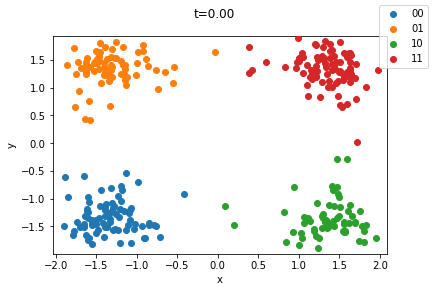

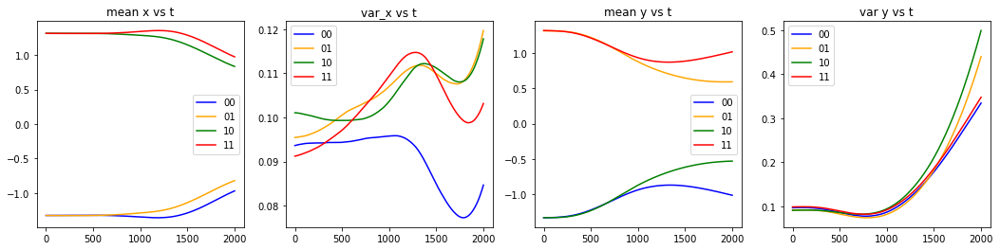

In [25]:
import kyle_tools as kt

all_state = sim.output.all_state['states']

ani,_,_ = kt.animate_sim(all_state[:,:,:,0], frame_skip=10, color_by_state=True)
helpingTools.plotStatisticsChangingWithTime(sim.output.all_statistic_with_time["step_indices"], \
                                            sim.output.all_statistic_with_time["values"], None)
HTML(ani.to_jshtml(fps=10))

In [20]:
sim.position_categories_index_dict.items()

dict_items([('00', [False, False, False, False, False, False, False, False, False, False, False, False, True, False, False, False, False, True, False, False, True, True, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, True, False, False, False, False, False, False, False, True, False, False, False, True, False, False, False, False, True, False, True, True, False, True, True, True, False, False, False, True, False, False, False, False, False, False, False, False, False, True, True, False, False, False, False, True, False, False, False, True, True, True, False, True, False, True, False, False, True, False, False, True, False, False, True, True, False, False, False, False, False, False, True, True, False, False, True, False, False, False, True, True, True, False, True, True, False, False, False, False, False, False, False, True, False, False, True, True, True, False, True, False, False, False, False, False, False, True, False, False,

In [21]:
time_dependent_statistic =  sim.output.all_statistic_with_time


In [22]:
time_dependent_statistic

{'step_indices': range(0, 2001),
 'trial_indices': slice(None, None, None),
 'values': array([[[-1.32574977,  0.09363728, -1.32902251,  0.09714096],
         [-1.32584338,  0.09545329,  1.31255299,  0.09214771],
         [ 1.31432473,  0.10106015, -1.32840772,  0.09131135],
         [ 1.31338075,  0.09122542,  1.31652391,  0.09905114]],
 
        [[-1.32574977,  0.09363728, -1.32902251,  0.09714096],
         [-1.32584338,  0.09545329,  1.31255299,  0.09214771],
         [ 1.31432473,  0.10106015, -1.32840772,  0.09131135],
         [ 1.31338075,  0.09122542,  1.31652391,  0.09905114]],
 
        [[-1.32574557,  0.09364332, -1.32900617,  0.09714833],
         [-1.32585427,  0.09545575,  1.31255606,  0.09214773],
         [ 1.31432472,  0.1010591 , -1.32841223,  0.09131741],
         [ 1.31337238,  0.09123087,  1.31650078,  0.09905776]],
 
        ...,
 
        [[-0.97111793,  0.08453893, -1.01075422,  0.33376735],
         [-0.82172891,  0.11949082,  0.59184433,  0.43825976],
        

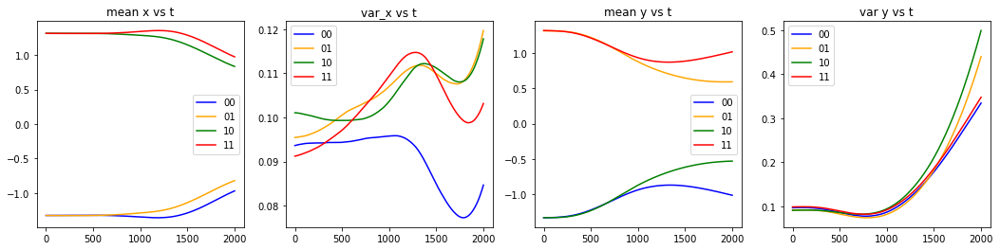

# time stretch sweep

In [34]:
sweepObject = {
    "_time_stretch": [float(x) for x in range(2, 22, 2)],
    "_damping": 1,
    "_gamma": 4, 
    "_theta": 80, 
    "_eta": 10
}

label="time_stretch_sweep"
print(sweepObject)

{'_time_stretch': [2.0, 4.0, 6.0, 8.0, 10.0, 12.0, 14.0, 16.0, 18.0, 20.0], '_damping': 1, '_gamma': 4, '_theta': 80, '_eta': 10}


========== start (1/10) ==========
time_stretch: 2.0, _damping: 1, _gamma: 4, _theta: 80, _eta: 10
[<simprocedures.basic_simprocedures.ReturnFinalState object at 0x7fdd480bb7c0>, <simprocedures.basic_simprocedures.MeasureAllState object at 0x7fdd480bb910>, <simprocedures.basic_simprocedures.MeasureStepValue object at 0x7fdd480bba00>, <simprocedures.running_measurements.MeasureAllValue object at 0x7fdd480bba90>, <simprocedures.running_measurements.MeasureFinalValue object at 0x7fdd480bbaf0>]
[[[-1.36705175 -1.25991281]
  [ 1.51698262  0.37977606]]

 [[ 1.55414845 -0.04962962]
  [ 1.17641473  0.93163129]]

 [[-1.12441443 -0.56335124]
  [ 1.18366875 -0.08497547]]

 ...

 [[-1.15728098  0.35580881]
  [-1.32054991 -1.73638246]]

 [[ 1.52228101  1.2381166 ]
  [-1.47511861 -1.03875395]]

 [[ 1.59723456 -0.11027317]
  [ 1.65356933 -0.67400207]]] (10000, 2, 2)
[[[-1.36705175 -1.25991281]
  [ 1.51698262  0.37977606]]

 [[ 1.55414845 -0.04962962]
  [ 1.17641473  0.93163129]]

 [[-1.12441443 -0.56

parameter/animation_ts_8.0_damping_1_parameter_4,80,10_times.gif is saved.
You are not saving data
========== finished (4/10) ==========
========== start (5/10) ==========
time_stretch: 10.0, _damping: 1, _gamma: 4, _theta: 80, _eta: 10
[<simprocedures.basic_simprocedures.ReturnFinalState object at 0x7fdd480bb7c0>, <simprocedures.basic_simprocedures.MeasureAllState object at 0x7fdd480bb910>, <simprocedures.basic_simprocedures.MeasureStepValue object at 0x7fdd480bba00>, <simprocedures.running_measurements.MeasureAllValue object at 0x7fdd480bba90>, <simprocedures.running_measurements.MeasureFinalValue object at 0x7fdd480bbaf0>]
[[[-1.36705175 -1.25991281]
  [ 1.51698262  0.37977606]]

 [[ 1.55414845 -0.04962962]
  [ 1.17641473  0.93163129]]

 [[-1.12441443 -0.56335124]
  [ 1.18366875 -0.08497547]]

 ...

 [[-1.15728098  0.35580881]
  [-1.32054991 -1.73638246]]

 [[ 1.52228101  1.2381166 ]
  [-1.47511861 -1.03875395]]

 [[ 1.59723456 -0.11027317]
  [ 1.65356933 -0.67400207]]] (10000, 2, 2

KeyboardInterrupt: 

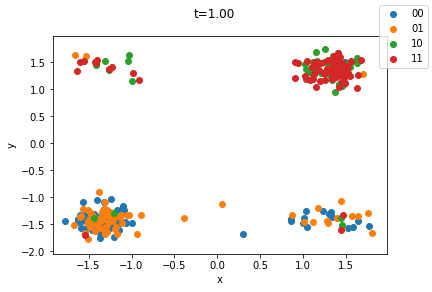

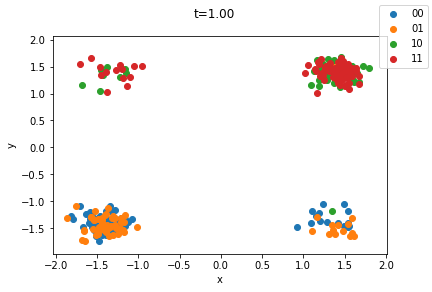

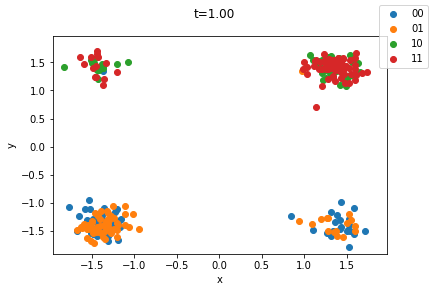

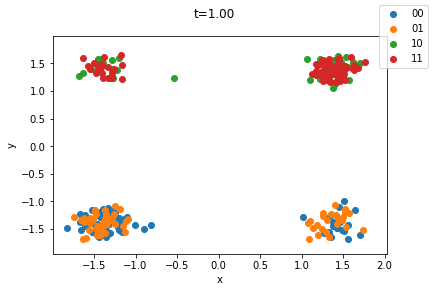

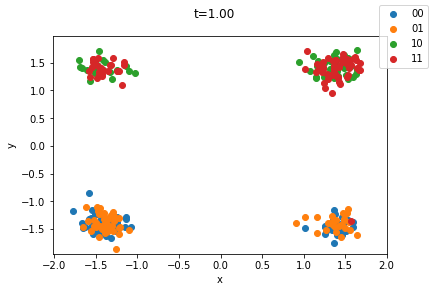

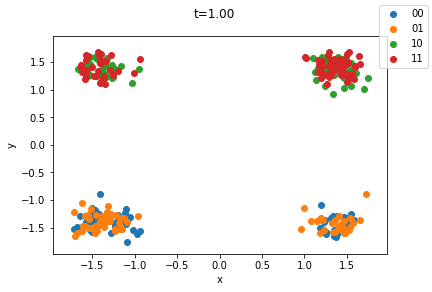

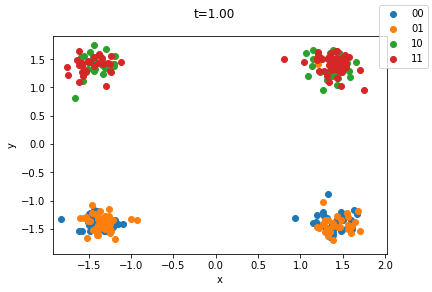

In [37]:
# import helpingTools
helpingTools = importlib.reload(helpingTools)
helpingTools.sweepFunction(sweepObject, system, init_state, procedures = procedures, label=label, save=True, overwrite=False, speedyRun = False)

# Damping Sweep

In [26]:
sweepObject = {
    "_time_stretch": 1,
    "_damping": [float(x) for x in np.linspace(1, 10, 10)],
    "_gamma": 4, 
    "_theta": 80, 
    "_eta": 10
}

label="damping_sweep"

========== start (1/10) ==========
time_stretch: 1, _damping: 1.0, _gamma: 4, _theta: 80, _eta: 10
[<simprocedures.basic_simprocedures.ReturnFinalState object at 0x7fdd480bb7c0>, <simprocedures.basic_simprocedures.MeasureAllState object at 0x7fdd480bb910>, <simprocedures.basic_simprocedures.MeasureStepValue object at 0x7fdd480bba00>, <simprocedures.running_measurements.MeasureAllValue object at 0x7fdd480bba90>, <simprocedures.running_measurements.MeasureFinalValue object at 0x7fdd480bbaf0>]
[[[-1.36705175 -1.25991281]
  [ 1.51698262  0.37977606]]

 [[ 1.55414845 -0.04962962]
  [ 1.17641473  0.93163129]]

 [[-1.12441443 -0.56335124]
  [ 1.18366875 -0.08497547]]

 ...

 [[-1.15728098  0.35580881]
  [-1.32054991 -1.73638246]]

 [[ 1.52228101  1.2381166 ]
  [-1.47511861 -1.03875395]]

 [[ 1.59723456 -0.11027317]
  [ 1.65356933 -0.67400207]]] (10000, 2, 2)
[[[-1.36705175 -1.25991281]
  [ 1.51698262  0.37977606]]

 [[ 1.55414845 -0.04962962]
  [ 1.17641473  0.93163129]]

 [[-1.12441443 -0.56

parameter/animation_ts_1_damping_4.0_parameter_4,80,10_times.gif is saved.
You are not saving data
========== finished (4/10) ==========
========== start (5/10) ==========
time_stretch: 1, _damping: 5.0, _gamma: 4, _theta: 80, _eta: 10
[<simprocedures.basic_simprocedures.ReturnFinalState object at 0x7fdd480bb7c0>, <simprocedures.basic_simprocedures.MeasureAllState object at 0x7fdd480bb910>, <simprocedures.basic_simprocedures.MeasureStepValue object at 0x7fdd480bba00>, <simprocedures.running_measurements.MeasureAllValue object at 0x7fdd480bba90>, <simprocedures.running_measurements.MeasureFinalValue object at 0x7fdd480bbaf0>]
[[[-1.36705175 -1.25991281]
  [ 1.51698262  0.37977606]]

 [[ 1.55414845 -0.04962962]
  [ 1.17641473  0.93163129]]

 [[-1.12441443 -0.56335124]
  [ 1.18366875 -0.08497547]]

 ...

 [[-1.15728098  0.35580881]
  [-1.32054991 -1.73638246]]

 [[ 1.52228101  1.2381166 ]
  [-1.47511861 -1.03875395]]

 [[ 1.59723456 -0.11027317]
  [ 1.65356933 -0.67400207]]] (10000, 2, 2)

parameter/animation_ts_1_damping_8.0_parameter_4,80,10_times.gif is saved.
You are not saving data
========== finished (8/10) ==========
========== start (9/10) ==========
time_stretch: 1, _damping: 9.0, _gamma: 4, _theta: 80, _eta: 10
[<simprocedures.basic_simprocedures.ReturnFinalState object at 0x7fdd480bb7c0>, <simprocedures.basic_simprocedures.MeasureAllState object at 0x7fdd480bb910>, <simprocedures.basic_simprocedures.MeasureStepValue object at 0x7fdd480bba00>, <simprocedures.running_measurements.MeasureAllValue object at 0x7fdd480bba90>, <simprocedures.running_measurements.MeasureFinalValue object at 0x7fdd480bbaf0>]
[[[-1.36705175 -1.25991281]
  [ 1.51698262  0.37977606]]

 [[ 1.55414845 -0.04962962]
  [ 1.17641473  0.93163129]]

 [[-1.12441443 -0.56335124]
  [ 1.18366875 -0.08497547]]

 ...

 [[-1.15728098  0.35580881]
  [-1.32054991 -1.73638246]]

 [[ 1.52228101  1.2381166 ]
  [-1.47511861 -1.03875395]]

 [[ 1.59723456 -0.11027317]
  [ 1.65356933 -0.67400207]]] (10000, 2, 2)

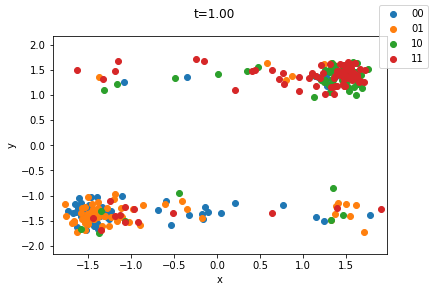

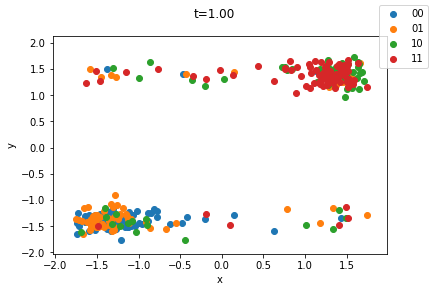

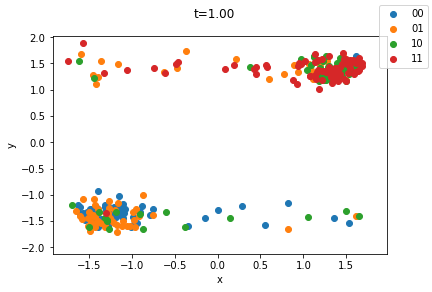

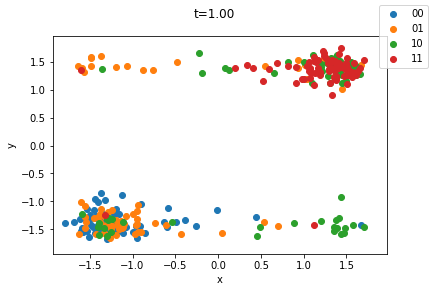

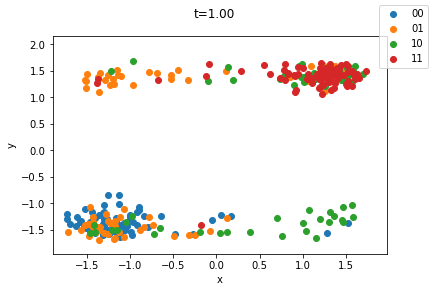

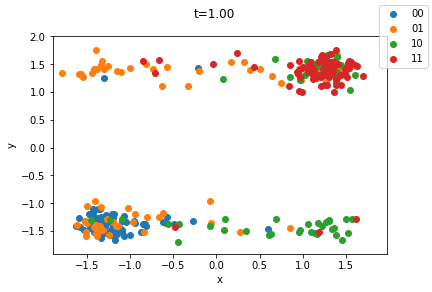

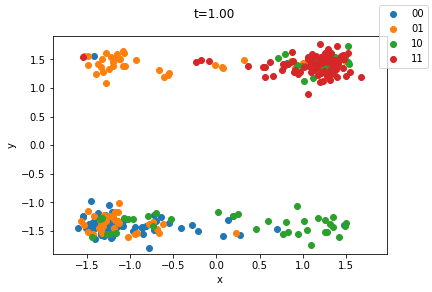

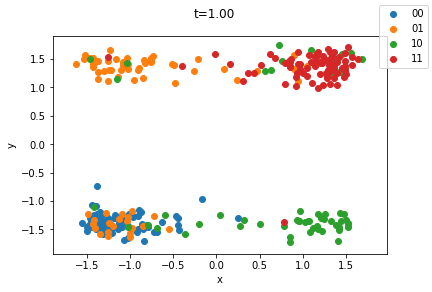

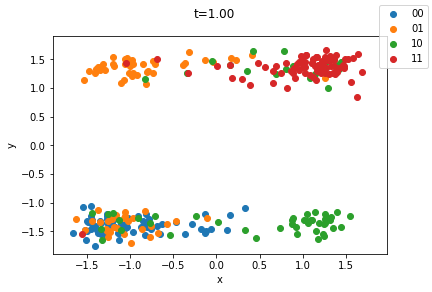

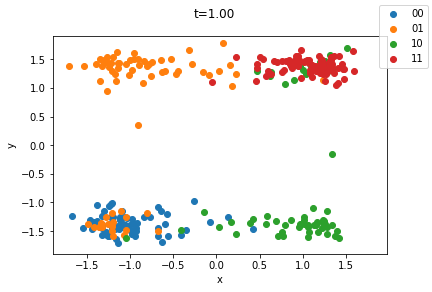

In [29]:
helpingTools = importlib.reload(helpingTools)
helpingTools.sweepFunction(sweepObject, system, init_state, procedures = procedures, label=label, save=True, overwrite=True, speedyRun = False)



# Theta Sweep

In [30]:
sweepObject = {
    "_time_stretch": 4,
    "_damping": 1,
    "_gamma": 1, 
    "_theta": [float(x) for x in np.linspace(0, 100, 11)], 
    "_eta": 10
}

label="theta_sweep"

========== start (1/11) ==========
time_stretch: 4, _damping: 1, _gamma: 1, _theta: 0.0, _eta: 10
[<simprocedures.basic_simprocedures.ReturnFinalState object at 0x7fdd480bb7c0>, <simprocedures.basic_simprocedures.MeasureAllState object at 0x7fdd480bb910>, <simprocedures.basic_simprocedures.MeasureStepValue object at 0x7fdd480bba00>, <simprocedures.running_measurements.MeasureAllValue object at 0x7fdd480bba90>, <simprocedures.running_measurements.MeasureFinalValue object at 0x7fdd480bbaf0>]
[[[-1.36705175 -1.25991281]
  [ 1.51698262  0.37977606]]

 [[ 1.55414845 -0.04962962]
  [ 1.17641473  0.93163129]]

 [[-1.12441443 -0.56335124]
  [ 1.18366875 -0.08497547]]

 ...

 [[-1.15728098  0.35580881]
  [-1.32054991 -1.73638246]]

 [[ 1.52228101  1.2381166 ]
  [-1.47511861 -1.03875395]]

 [[ 1.59723456 -0.11027317]
  [ 1.65356933 -0.67400207]]] (10000, 2, 2)
[[[-1.36705175 -1.25991281]
  [ 1.51698262  0.37977606]]

 [[ 1.55414845 -0.04962962]
  [ 1.17641473  0.93163129]]

 [[-1.12441443 -0.563

parameter/animation_ts_4_damping_1_parameter_1,30.0,10_times.gif is saved.
You are not saving data
========== finished (4/11) ==========
========== start (5/11) ==========
time_stretch: 4, _damping: 1, _gamma: 1, _theta: 40.0, _eta: 10
[<simprocedures.basic_simprocedures.ReturnFinalState object at 0x7fdd480bb7c0>, <simprocedures.basic_simprocedures.MeasureAllState object at 0x7fdd480bb910>, <simprocedures.basic_simprocedures.MeasureStepValue object at 0x7fdd480bba00>, <simprocedures.running_measurements.MeasureAllValue object at 0x7fdd480bba90>, <simprocedures.running_measurements.MeasureFinalValue object at 0x7fdd480bbaf0>]
[[[-1.36705175 -1.25991281]
  [ 1.51698262  0.37977606]]

 [[ 1.55414845 -0.04962962]
  [ 1.17641473  0.93163129]]

 [[-1.12441443 -0.56335124]
  [ 1.18366875 -0.08497547]]

 ...

 [[-1.15728098  0.35580881]
  [-1.32054991 -1.73638246]]

 [[ 1.52228101  1.2381166 ]
  [-1.47511861 -1.03875395]]

 [[ 1.59723456 -0.11027317]
  [ 1.65356933 -0.67400207]]] (10000, 2, 2)

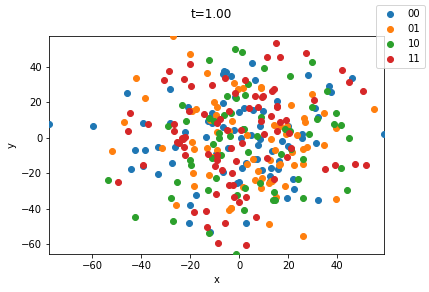

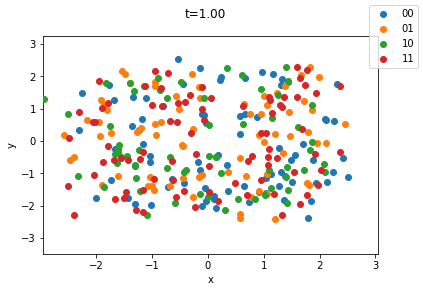

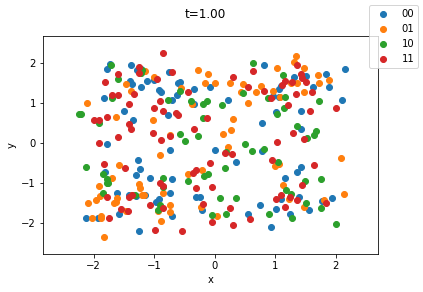

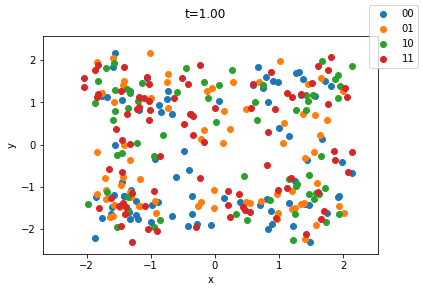

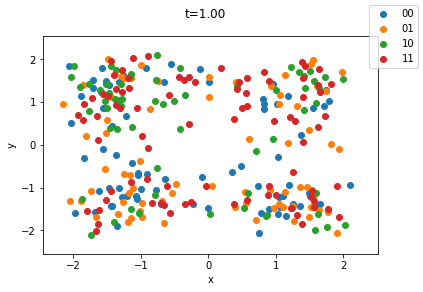

...

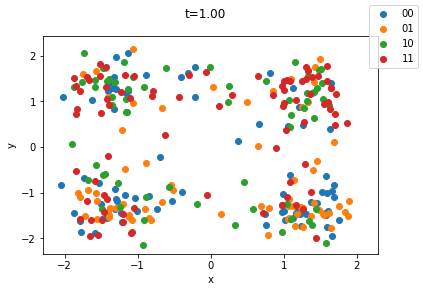

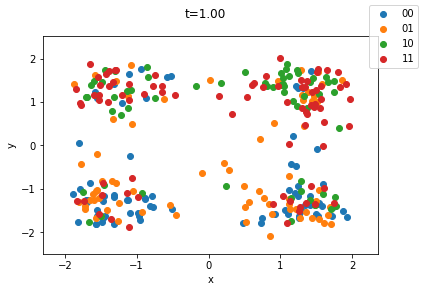

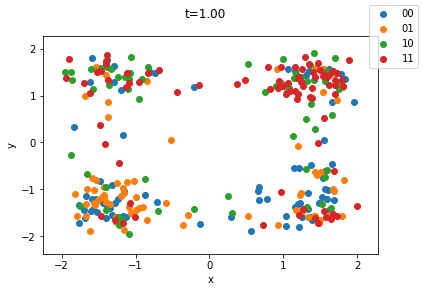

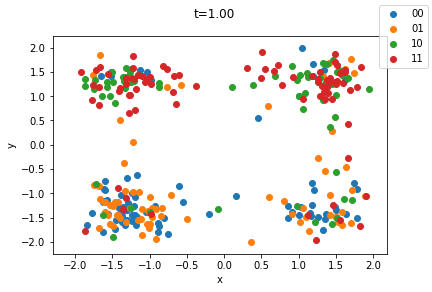

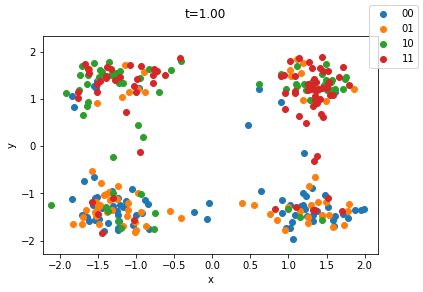

In [31]:
helpingTools.sweepFunction(sweepObject, system, init_state, procedures = procedures, label=label, save=True, overwrite=False, speedyRun = False)

# Eta Sweep

In [32]:
sweepObject = {
    "_time_stretch": 4,
    "_damping": 1,
    "_gamma": 4, 
    "_theta": 80, 
    "_eta": [float(x) for x in np.linspace(0, 100, 11)]
}

label="eta_sweep"

========== start (1/11) ==========
time_stretch: 4, _damping: 1, _gamma: 4, _theta: 80, _eta: 0.0
[<simprocedures.basic_simprocedures.ReturnFinalState object at 0x7fdd480bb7c0>, <simprocedures.basic_simprocedures.MeasureAllState object at 0x7fdd480bb910>, <simprocedures.basic_simprocedures.MeasureStepValue object at 0x7fdd480bba00>, <simprocedures.running_measurements.MeasureAllValue object at 0x7fdd480bba90>, <simprocedures.running_measurements.MeasureFinalValue object at 0x7fdd480bbaf0>]
[[[-1.36705175 -1.25991281]
  [ 1.51698262  0.37977606]]

 [[ 1.55414845 -0.04962962]
  [ 1.17641473  0.93163129]]

 [[-1.12441443 -0.56335124]
  [ 1.18366875 -0.08497547]]

 ...

 [[-1.15728098  0.35580881]
  [-1.32054991 -1.73638246]]

 [[ 1.52228101  1.2381166 ]
  [-1.47511861 -1.03875395]]

 [[ 1.59723456 -0.11027317]
  [ 1.65356933 -0.67400207]]] (10000, 2, 2)
[[[-1.36705175 -1.25991281]
  [ 1.51698262  0.37977606]]

 [[ 1.55414845 -0.04962962]
  [ 1.17641473  0.93163129]]

 [[-1.12441443 -0.563

parameter/animation_ts_4_damping_1_parameter_4,80,30.0_times.gif is saved.
You are not saving data
========== finished (4/11) ==========
========== start (5/11) ==========
time_stretch: 4, _damping: 1, _gamma: 4, _theta: 80, _eta: 40.0
[<simprocedures.basic_simprocedures.ReturnFinalState object at 0x7fdd480bb7c0>, <simprocedures.basic_simprocedures.MeasureAllState object at 0x7fdd480bb910>, <simprocedures.basic_simprocedures.MeasureStepValue object at 0x7fdd480bba00>, <simprocedures.running_measurements.MeasureAllValue object at 0x7fdd480bba90>, <simprocedures.running_measurements.MeasureFinalValue object at 0x7fdd480bbaf0>]
[[[-1.36705175 -1.25991281]
  [ 1.51698262  0.37977606]]

 [[ 1.55414845 -0.04962962]
  [ 1.17641473  0.93163129]]

 [[-1.12441443 -0.56335124]
  [ 1.18366875 -0.08497547]]

 ...

 [[-1.15728098  0.35580881]
  [-1.32054991 -1.73638246]]

 [[ 1.52228101  1.2381166 ]
  [-1.47511861 -1.03875395]]

 [[ 1.59723456 -0.11027317]
  [ 1.65356933 -0.67400207]]] (10000, 2, 2)

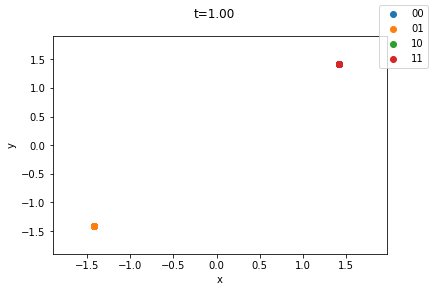

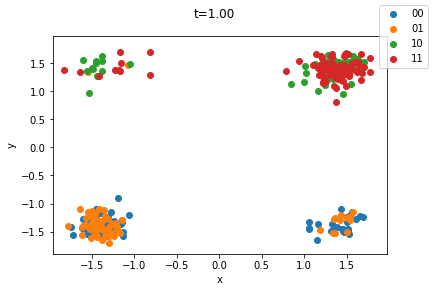

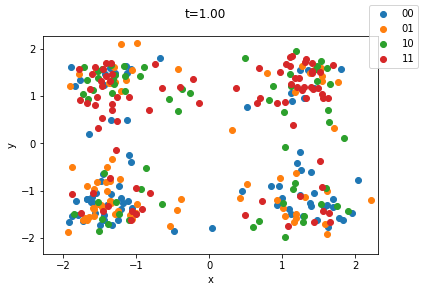

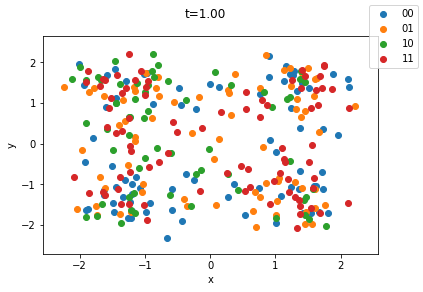

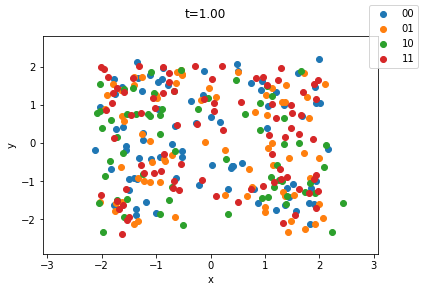

...

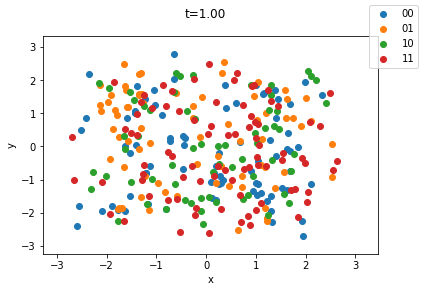

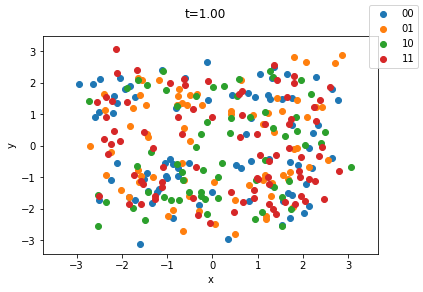

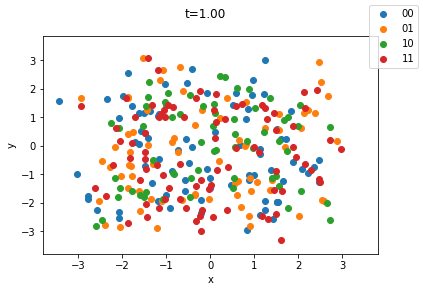

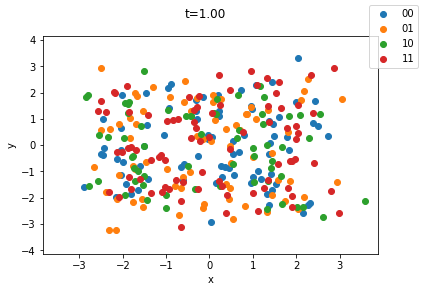

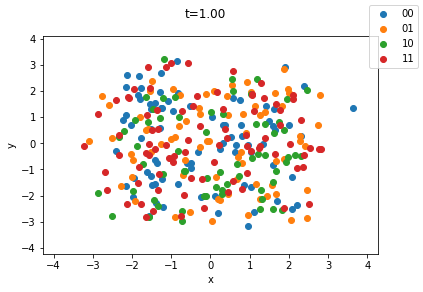

In [33]:
helpingTools.sweepFunction(sweepObject, system, init_state, procedures = procedures, label=label, save=True, overwrite=False, speedyRun = False)